In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
from sklearn.datasets import load_breast_cancer

In [ ]:
data = pd.DataFrame(load_breast_cancer().data,columns = load_breast_cancer().feature_names)
data.head()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [ ]:
import sklearn.cluster as cluster

In [ ]:
%time
kmeans = cluster.KMeans(n_clusters=5 ,init="k-means++")
kmeans = kmeans.fit(data[['mean area','mean smoothness','worst radius']])

CPU times: user 4 µs, sys: 0 ns, total: 4 µs
Wall time: 8.58 µs


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


In [ ]:
%time
kmeans = cluster.KMeans(n_clusters=5 ,init="k-means++")
kmeans = kmeans.fit(data)

CPU times: user 4 µs, sys: 0 ns, total: 4 µs
Wall time: 7.15 µs


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


In [ ]:
kmeans.

KMeans(n_clusters=5)

In [ ]:
data['Clusters'] = kmeans.labels_

<Axes: xlabel='mean area', ylabel='mean smoothness'>

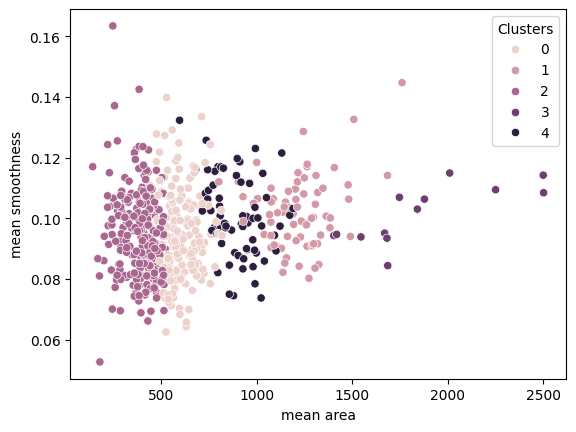

In [ ]:
sns.scatterplot(x="mean area", y="mean smoothness",hue = 'Clusters',  data=data)

<Axes: xlabel='worst radius', ylabel='worst fractal dimension'>

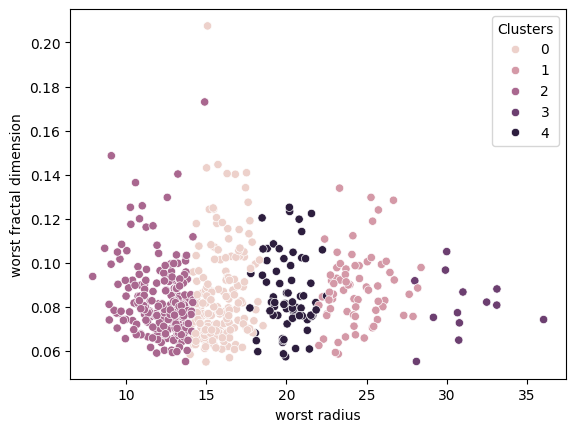

In [ ]:
sns.scatterplot(x="worst radius", y="worst fractal dimension",hue = 'Clusters',  data=data)

In [ ]:
load_breast_cancer().feature_names

array(['mean radius', 'mean texture', 'mean perimeter', 'mean area',
       'mean smoothness', 'mean compactness', 'mean concavity',
       'mean concave points', 'mean symmetry', 'mean fractal dimension',
       'radius error', 'texture error', 'perimeter error', 'area error',
       'smoothness error', 'compactness error', 'concavity error',
       'concave points error', 'symmetry error',
       'fractal dimension error', 'worst radius', 'worst texture',
       'worst perimeter', 'worst area', 'worst smoothness',
       'worst compactness', 'worst concavity', 'worst concave points',
       'worst symmetry', 'worst fractal dimension'], dtype='<U23')

<Axes: xlabel='symmetry error', ylabel='concavity error'>

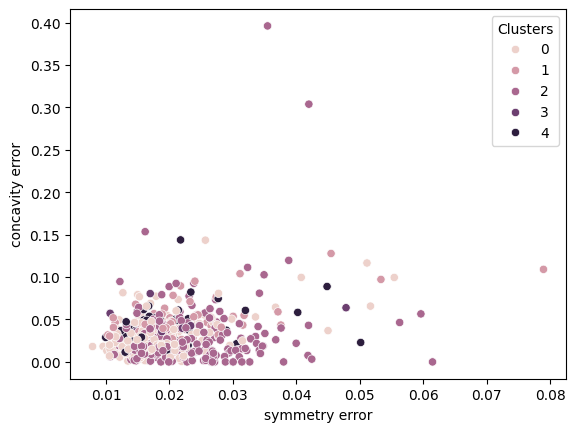

In [ ]:
sns.scatterplot(x="symmetry error", y="concavity error",hue = 'Clusters',  data=data)

CPU times: user 5 µs, sys: 0 ns, total: 5 µs
Wall time: 8.11 µs


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


<Axes: xlabel='symmetry error', ylabel='concavity error'>

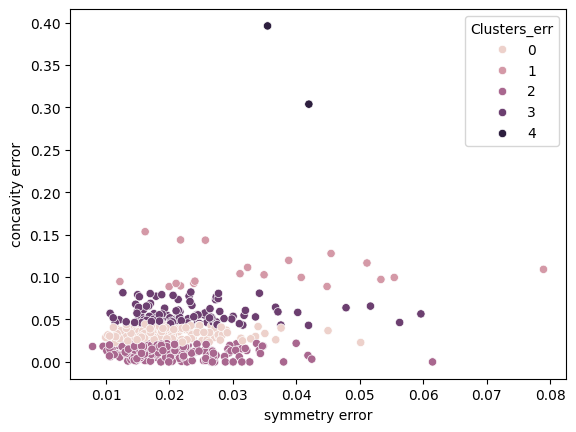

In [ ]:
%time
kmeans = cluster.KMeans(n_clusters=5 ,init="k-means++")
kmeans = kmeans.fit(data[['symmetry error','concavity error']])
data['Clusters_err'] = kmeans.labels_
sns.scatterplot(x="symmetry error", y="concavity error",hue = 'Clusters_err',  data=data)

<Axes: xlabel='worst radius', ylabel='worst fractal dimension'>

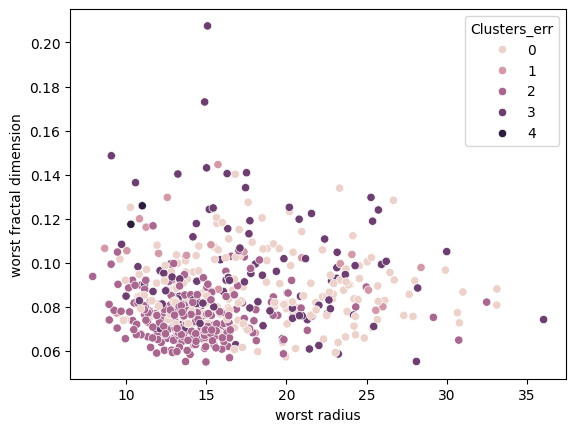

In [ ]:
sns.scatterplot(x="worst radius", y="worst fractal dimension",hue = 'Clusters_err',  data=data)

In [ ]:

import plotly as py
import plotly.graph_objs as go

import warnings
warnings.filterwarnings('ignore')

trace1 = go.Scatter3d(
    x= data['symmetry error'],
    y= data['mean smoothness'],
    z= data['mean area'],
    mode='markers',
     marker=dict(
        color = data['Clusters'],
        size= 10,
        line=dict(
            color= data['Clusters'],
            width= 12
        ),
        opacity=0.8
     )
)
df = [trace1]
layout = go.Layout(
    title= 'Clusters using Agglomerative Clustering',
    scene = dict(
            xaxis = dict(title  = 'symmetry error'),
            yaxis = dict(title  = 'mean smoothness'),
            zaxis = dict(title  = 'mean area')
        )
)
fig = go.Figure(data=df, layout=layout)
py.offline.iplot(fig)

In [ ]:
sns.pairplot(data = data,hue = 'Clusters',corner=True)

In [ ]:
from sklearn import preprocessing
import scipy.cluster.hierarchy as sch
from sklearn.cluster import AgglomerativeClustering

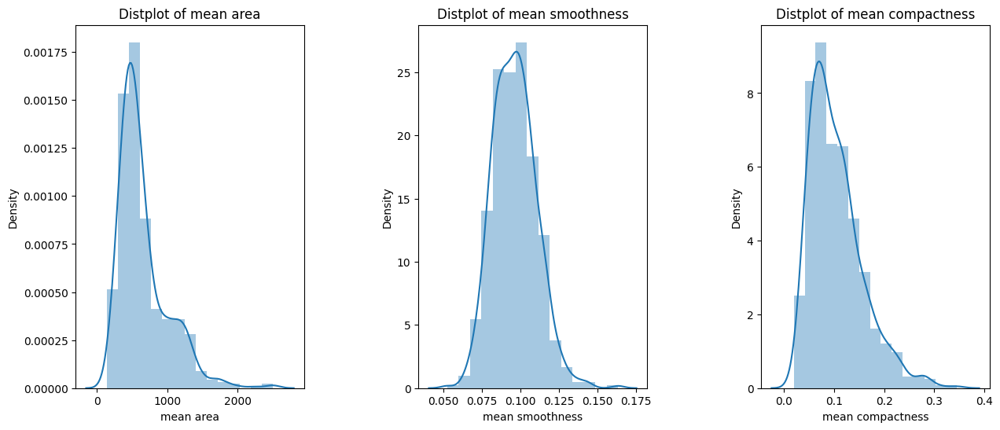

In [ ]:
plt.figure(1 , figsize = (15 , 6))
n = 0
for x in ['mean area' , 'mean smoothness' , 'mean compactness']:
    n += 1
    plt.subplot(1 , 3 , n)
    plt.subplots_adjust(hspace = 0.5 , wspace = 0.5)
    sns.distplot(data[x] , bins = 15)
    plt.title('Distplot of {}'.format(x))
plt.show()

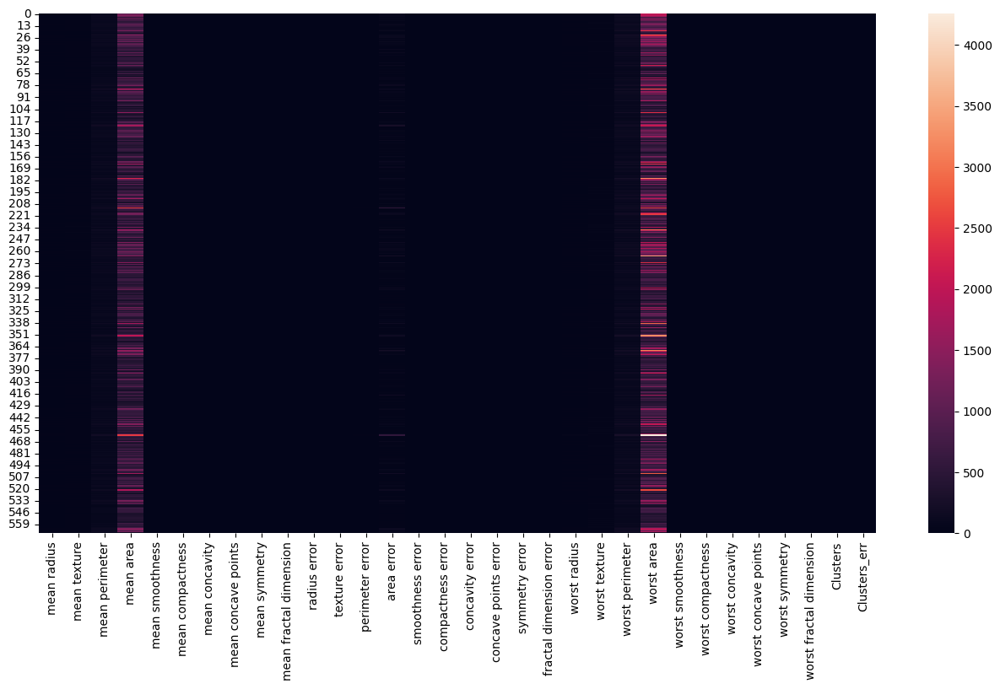

In [ ]:
plt.figure(1, figsize = (16 ,8))
sns.heatmap(data)
plt.show()

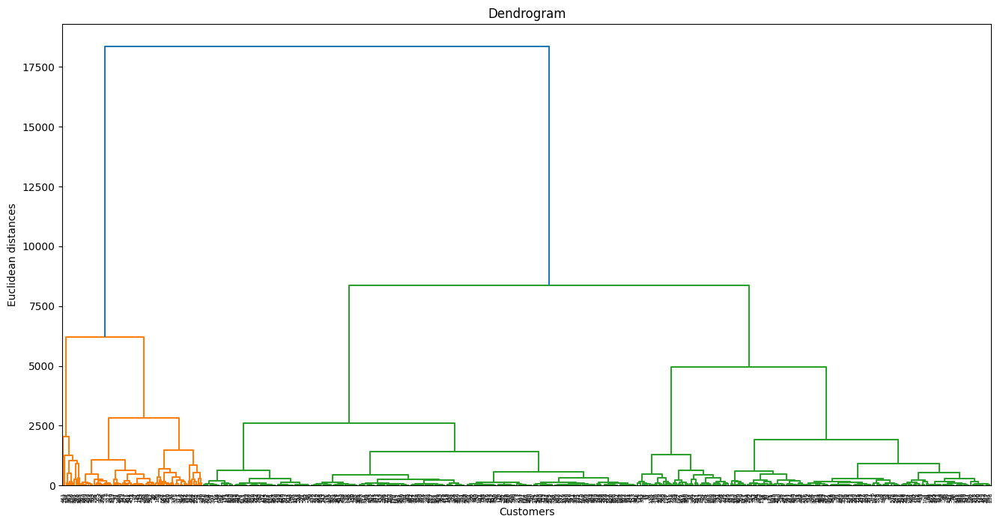

In [ ]:
plt.figure(1, figsize = (16 ,8))
dendrogram = sch.dendrogram(sch.linkage(data, method  = "ward"))

plt.title('Dendrogram')
plt.xlabel('Customers')
plt.ylabel('Euclidean distances')
plt.show()

In [ ]:
hc = AgglomerativeClustering(n_clusters = 5, affinity = 'euclidean', linkage ='average')

y_hc = hc.fit_predict(data)
y_hc

array([1, 1, 1, 3, 1, 3, 1, 3, 3, 3, 1, 1, 1, 3, 3, 3, 1, 1, 0, 3, 3, 3,
       3, 0, 1, 1, 3, 1, 1, 1, 1, 3, 1, 1, 1, 1, 3, 3, 3, 3, 3, 3, 1, 3,
       3, 1, 3, 3, 3, 3, 3, 3, 3, 1, 3, 3, 1, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 1, 3, 1, 3, 3, 1, 3, 1, 1, 3, 3, 3, 0, 1, 3, 1, 3, 1,
       3, 3, 3, 3, 3, 3, 3, 1, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 0, 3,
       3, 3, 3, 3, 3, 3, 3, 1, 1, 1, 3, 1, 0, 3, 3, 3, 3, 1, 3, 1, 3, 1,
       1, 3, 1, 3, 3, 3, 3, 3, 3, 1, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 1, 1, 3, 3, 3, 1, 1, 3, 0, 3, 3, 1, 1, 3, 3, 3, 1, 3, 3, 3,
       3, 1, 3, 3, 0, 1, 1, 3, 3, 3, 1, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 1,
       1, 3, 3, 1, 0, 1, 3, 3, 3, 1, 3, 3, 1, 3, 4, 1, 3, 3, 3, 3, 1, 0,
       3, 3, 3, 1, 3, 3, 3, 3, 3, 3, 1, 3, 3, 1, 3, 3, 0, 1, 3, 1, 3, 3,
       3, 3, 1, 3, 3, 3, 3, 3, 1, 3, 1, 1, 1, 3, 1, 3, 1, 3, 1, 1, 1, 3,
       1, 0, 3, 3, 3, 3, 3, 3, 0, 3, 1, 3, 3, 1, 3, 3, 1, 3, 1, 1, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 1,

In [ ]:
data['cluster'] = pd.DataFrame(y_hc)

In [ ]:
trace1 = go.Scatter3d(
    x= data['mean area'],
    y= data['mean smoothness'],
    z= data['mean compactness'],
    mode='markers',
     marker=dict(
        color = data['cluster'],
        size= 10,
        line=dict(
            color= data['cluster'],
            width= 12
        ),
        opacity=0.8
     )
)
df = [trace1]
layout = go.Layout(
    title= 'Clusters using Agglomerative Clustering',
    scene = dict(
            xaxis = dict(title  = 'Age'),
            yaxis = dict(title  = 'Spending Score'),
            zaxis = dict(title  = 'Annual Income')
        )
)
fig = go.Figure(data=df, layout=layout)
py.offline.iplot(fig)